# Deep Learning with PyTorch Step-by-Step: A Beginner's Guide

# Chapter 7

In [24]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [25]:
try:
    import google.colab
    import requests
    url = 'https://raw.githubusercontent.com/PauloBigooD/PPGEEC2318-Machine-Learning-Transfer-Learning/master/config.py'
    r = requests.get(url, allow_redirects=True)
    open('config.py', 'wb').write(r.content)
except ModuleNotFoundError:
    pass

from config import *
config_chapter7()
# This is needed to render the plots in this chapter
from plots.chapter7 import *

Finished!


In [26]:
import numpy as np
from PIL import Image

import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F

from torchvision import transforms

from torch.utils.data import DataLoader, Dataset, random_split, TensorDataset
from torchvision.transforms.v2 import Compose, ToImage, Normalize, \
Resize, ToPILImage, CenterCrop, RandomResizedCrop, ToDtype
from torchvision.datasets import ImageFolder
from torchvision.models import alexnet, resnet18, inception_v3

# Updated for Torchvision 0.15
from torchvision.models.alexnet import AlexNet_Weights
from torchvision.models.inception import Inception_V3_Weights
from torchvision.models.resnet import ResNet18_Weights
# from torchvision.models.alexnet import model_urls

try:
    from torchvision.models.utils import load_state_dict_from_url
except ImportError:
    from torch.hub import load_state_dict_from_url

from stepbystep.v3 import StepByStep

# ImageNet Large Scale Visual Recognition Challenge (ILSVRC)

## Comparing Architectures

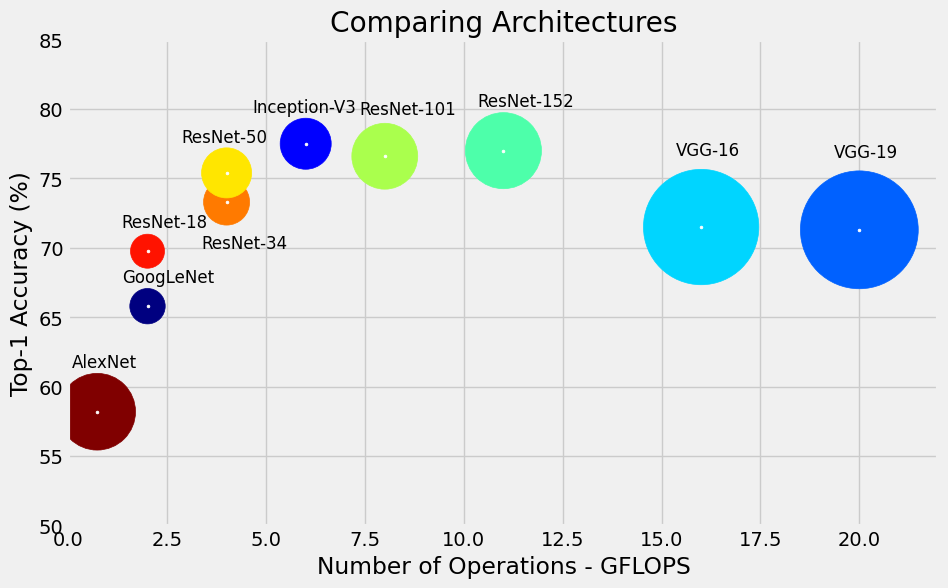

In [27]:
fig = figure1()

*Source: Data for accuracy and GFLOPs estimates obtained from [this](https://github.com/albanie/convnet-burden) report, number of parameters proportional to the size of the circles) obtained from Torchvision’s models. For a more detailed analysis, see Canziani, A., Culurciello, E., Paszke, A. ["An Analysis of Deep Neural Network Models for Practical Applications"](https://arxiv.org/pdf/1605.07678.pdf)(2017).*

# Transfer Learning in Practice

## Pre-Trained Model

The `pretrained` argument of Torchvision models is being deprecated. Instead, you should use the `weights` argument.

To load a model without its weights, you can simply set the argument to `None`.

```python
alex = alexnet(weights=None)
```

To actually load the weights of a pretrained model, you will need to, first, import the corresponding `Weights` object, for example:
```python
from torchvision.models.alexnet import AlexNet_Weights
```

Each `Weights` object has one or more sets of weights (for different versions), but you can also use the (current, since it may change) `DEFAULT` version for loading the pretrained model:
```python
alex = alexnet(weights=AlexNet_Weights.DEFAULT)
```

The code above is the recommended way of loading pretrained models.

But, for the sake of completion, in the code cells that follow I will still illustrate how to retrieve the URL pointing to the weights, and an alternative way of loading the state dictionary directly.

In [28]:
# UPDATED
###########################################################
# Setting weights to None loads an untrained model
#alex = alexnet(weights=None)
alex = alexnet(pretrained=True)
###########################################################

print(alex)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 165MB/s]


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

### Adaptive Pooling

In [29]:
result1 = F.adaptive_avg_pool2d(torch.randn(16, 32, 32), output_size=(6, 6))
result2 = F.adaptive_avg_pool2d(torch.randn(16, 12, 12), output_size=(6, 6))
result1.shape, result2.shape

(torch.Size([16, 6, 6]), torch.Size([16, 6, 6]))

### Loading Weights

In [30]:
# repeating import from the top for reference
from torchvision.models.alexnet import AlexNet_Weights

# UPDATED
###########################################################
# This is the recommended way of loading a pretrained
# model's weights
weights = AlexNet_Weights.DEFAULT
alex = alexnet(weights=AlexNet_Weights.DEFAULT)
###########################################################

In [31]:
# Before, you could get the URL like this
# url = model_urls['alexnet']

# In Torchvision 0.15, the WEIGHTS object contains the URL
url = weights.url
url

'https://download.pytorch.org/models/alexnet-owt-7be5be79.pth'

In [32]:
# You may still load the state dict from the URL if you want...
state_dict = load_state_dict_from_url(url, model_dir='./pretrained', progress=True)

# But, in Torchvision 0.15, you can use the WEIGHTS object to load the state dict
# state_dict = weights.get_state_dict(progress=True)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to ./pretrained/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:00<00:00, 312MB/s]


In [33]:
# If you have the state dict, you can load it into the empty model
alex = alexnet(weights=None)
alex.load_state_dict(state_dict)

<All keys matched successfully>

### Model Freezing

In [34]:
def freeze_model(model):
    for parameter in model.parameters():
        parameter.requires_grad = False

In [35]:
freeze_model(alex)

### Top of the Model

In [36]:
print(alex.classifier)

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)


In [37]:
torch.manual_seed(55)
alex.classifier[6] = nn.Linear(4096, 3)

![](https://github.com/dvgodoy/PyTorchStepByStep/blob/master/images/alexnet.png?raw=1)

*Source: Generated using Alexander Lenail’s [NN-SVG](http://alexlenail.me/NN-SVG/) and adapted by the author*

In [38]:
for name, param in alex.named_parameters():
    if param.requires_grad == True:
        print(name)

classifier.6.weight
classifier.6.bias


## Model Configuration

In [39]:
torch.manual_seed(55)
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_alex = optim.Adam(alex.parameters(), lr=3e-4)

## Data Preparation

In [40]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("tongpython/cat-and-dog")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1


In [41]:
# Diretórios do dataset
train_data_dir = '/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/training_set/training_set'
test_data_dir = '/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/test_set/test_set'

In [44]:
composer = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


train_data = ImageFolder(root=train_data_dir, transform=composer)
val_data = ImageFolder(root=test_data_dir, transform=composer)

train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32)

In [45]:
# Looping through it, get a batch on each loop
#Here dataloader is a generator. To get data out of it, you need to loop through it or convert it to an iterator and call next().
for images, labels in train_data:
    pass

# Get one batch
images, labels = next(iter(train_data))
images.shape

torch.Size([3, 224, 224])

## Model Training

In [47]:
sbs_alex = StepByStep(alex, multi_loss_fn, optimizer_alex)
sbs_alex.set_loaders(train_loader, val_loader)
sbs_alex.train(10)

In [48]:
StepByStep.loader_apply(val_loader, sbs_alex.correct)

tensor([[ 977, 1011],
        [ 966, 1012],
        [   0,    0]])

## Generating a Dataset of Features

In [49]:
alex.classifier[6] = nn.Identity()
print(alex.classifier)

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Identity()
)


In [50]:
def preprocessed_dataset(model, loader, device=None):
    if device is None:
        device = next(model.parameters()).device

    features = None
    labels = None

    for i, (x, y) in enumerate(loader):
        model.eval()
        x = x.to(device)
        output = model(x)
        if i == 0:
            features = output.detach().cpu()
            labels = y.cpu()
        else:
            features = torch.cat([features, output.detach().cpu()])
            labels = torch.cat([labels, y.cpu()])

    dataset = TensorDataset(features, labels)
    return dataset

In [51]:
train_preproc = preprocessed_dataset(alex, train_loader)
val_preproc = preprocessed_dataset(alex, val_loader)

In [52]:
torch.save(train_preproc.tensors, 'preproc.pth')
torch.save(val_preproc.tensors, 'val_preproc.pth')

In [53]:
x, y = torch.load('preproc.pth') # Assuming weights_only is not a valid argument
train_preproc = TensorDataset(x, y)
val_preproc = TensorDataset(*torch.load('val_preproc.pth'))

<ipython-input-53-ce5581c6bec2>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  x, y = torch.load('preproc.pth') # Assuming weights_only is not a valid argument
<ipython-in

In [54]:
train_preproc_loader = DataLoader(train_preproc, batch_size=32, shuffle=True)
val_preproc_loader = DataLoader(val_preproc, batch_size=32)

## Top Model

In [55]:
torch.manual_seed(55)
top_model = nn.Sequential(nn.Linear(4096, 3))
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_top = optim.Adam(top_model.parameters(), lr=3e-4)

In [56]:
sbs_top = StepByStep(top_model, multi_loss_fn, optimizer_top)
sbs_top.set_loaders(train_preproc_loader, val_preproc_loader)
sbs_top.train(100)

In [57]:
sbs_alex.model.classifier[6] = top_model
print(sbs_alex.model.classifier)

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Sequential(
    (0): Linear(in_features=4096, out_features=3, bias=True)
  )
)


In [58]:
StepByStep.loader_apply(val_loader, sbs_alex.correct)

tensor([[ 970, 1011],
        [ 960, 1012],
        [   0,    0]])

# Auxiliary Classifiers (Side-Heads)

![](https://github.com/dvgodoy/PyTorchStepByStep/blob/master/images/inception_model.png?raw=1)

In [59]:
# repeating import from the top for reference
from torchvision.models.inception import Inception_V3_Weights

# UPDATED
###########################################################
# This is the recommended way of loading a pretrained
# model's weights
model = inception_v3(weights=Inception_V3_Weights.DEFAULT)
# model = inception_v3(pretrained=True)
###########################################################

freeze_model(model)

torch.manual_seed(55)
model.AuxLogits.fc = nn.Linear(768, 3)
model.fc = nn.Linear(2048, 3)

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 133MB/s]


In [60]:
def inception_loss(outputs, labels):
    try:
        main, aux = outputs
    except ValueError:
        main = outputs
        aux = None
        loss_aux = 0

    multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
    loss_main = multi_loss_fn(main, labels)
    if aux is not None:
        loss_aux = multi_loss_fn(aux, labels)
    return loss_main + 0.4 * loss_aux

In [61]:
optimizer_model = optim.Adam(model.parameters(), lr=3e-4)
sbs_incep = StepByStep(model, inception_loss, optimizer_model)

In [62]:
composer = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_data = ImageFolder(root=train_data_dir, transform=composer)
val_data = ImageFolder(root=test_data_dir, transform=composer)

# Builds a loader of each set
train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32)

In [67]:
sbs_incep.set_loaders(train_loader, val_loader)
sbs_incep.train(10)

OutOfMemoryError: CUDA out of memory. Tried to allocate 88.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 49.06 MiB is free. Process 2629 has 14.70 GiB memory in use. Of the allocated memory 847.39 MiB is allocated by PyTorch, and 94.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
StepByStep.loader_apply(val_loader, sbs_incep.correct)

tensor([[ 971, 1011],
        [ 995, 1012],
        [   0,    0]])

# 1x1 Convolutions

![](https://github.com/dvgodoy/PyTorchStepByStep/blob/master/images/1conv1.png?raw=1)

![](https://github.com/dvgodoy/PyTorchStepByStep/blob/master/images/1conv2.png?raw=1)

$$
\Large
\begin{array}
&\text{Filter 1}: -&1& \text{R} &+& 2& \text{G} &+& 0& \text{B}
\\
\text{Filter 2}: &2& \text{R} &+& 0& \text{G} &-& 2& \text{B}
\end{array}
$$

In [ ]:
scissors = Image.open('/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/test_set/test_set/cats/cat.4121.jpg')
width, height = scissors.size
image = ToDtype(torch.float32, scale=True)(ToImage()(scissors))[:3, :, :].view(1, 3, height, width)

weights = torch.tensor([0.2126, 0.7152, 0.0722]).view(1, 3, 1, 1)
convolved = F.conv2d(input=image, weight=weights)

converted = ToPILImage()(convolved[0])
grayscale = scissors.convert('L')

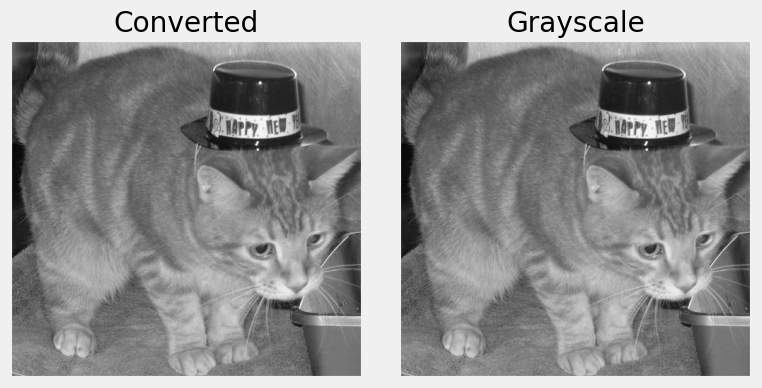

In [ ]:
fig = compare_grayscale(converted, grayscale)

# Inception Modules

![](https://github.com/dvgodoy/PyTorchStepByStep/blob/master/images/inception_modules.png?raw=1)

In [ ]:
class Inception(nn.Module):
    def __init__(self, in_channels):
        super(Inception, self).__init__()
        # in_channels@HxW -> 2@HxW
        self.branch1x1_1 = nn.Conv2d(in_channels, 2, kernel_size=1)

        # in_channels@HxW -> 2@HxW -> 3@HxW
        self.branch5x5_1 = nn.Conv2d(in_channels, 2, kernel_size=1)
        self.branch5x5_2 = nn.Conv2d(2, 3, kernel_size=5, padding=2)

        # in_channels@HxW -> 2@HxW -> 3@HxW
        self.branch3x3_1 = nn.Conv2d(in_channels, 2, kernel_size=1)
        self.branch3x3_2 = nn.Conv2d(2, 3, kernel_size=3, padding=1)

        # in_channels@HxW -> in_channels@HxW -> 2@HxW
        self.branch_pool_1 = nn.AvgPool2d(kernel_size=3, stride=1, padding=1)
        self.branch_pool_2 = nn.Conv2d(in_channels, 2, kernel_size=1)

    def forward(self, x):
        # Produces 2 channels
        branch1x1 = self.branch1x1_1(x)
        # Produces 3 channels
        branch5x5 = self.branch5x5_1(x)
        branch5x5 = self.branch5x5_2(branch5x5)
        # Produces 3 channels
        branch3x3 = self.branch3x3_1(x)
        branch3x3 = self.branch3x3_2(branch3x3)
        # Produces 2 channels
        branch_pool = self.branch_pool_1(x)
        branch_pool = self.branch_pool_2(branch_pool)
        # Concatenates all channels together (10)
        outputs = torch.cat([branch1x1, branch5x5, branch3x3, branch_pool], 1)
        return outputs

In [ ]:
inception = Inception(in_channels=3)
output = inception(image)
output.shape

torch.Size([1, 10, 478, 499])

In [ ]:
class BasicConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super(BasicConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, bias=False, **kwargs)
        self.bn = nn.BatchNorm2d(out_channels, eps=0.001)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return F.relu(x, inplace=True)

# Batch Normalization

$$
\Large
\overline{X} = \frac{1}{n}\sum_{i=1}^n{x_i}
\\
\Large
\sigma(X) = \sqrt{\frac{1}{n}\sum_{i=1}^n{(x_i - \overline{X})^2}}
$$

$$
\Large
\text{standardized }x_i = \frac{x_i-\overline{X}}{\sigma(X)+ \epsilon}
$$

$$
\Large
\text{batch normed }x_i = b + w \text{ standardized }x_i
$$

$$
\Large
\text{batch normed }x_i = \text{standardized }x_i\ \gamma + \beta
$$

## Running Statistics

In [ ]:
torch.manual_seed(55)
dummy_points = torch.randn((200, 2)) + torch.rand((200, 2)) * 2
dummy_labels = torch.randint(2, (200, 1))
dummy_dataset = TensorDataset(dummy_points, dummy_labels)
dummy_loader = DataLoader(dummy_dataset, batch_size=64, shuffle=True)

In [ ]:
iterator = iter(dummy_loader)
batch1 = next(iterator)
batch2 = next(iterator)
batch3 = next(iterator)

In [ ]:
mean1, var1 = batch1[0].mean(axis=0), batch1[0].var(axis=0)
mean1, var1

(tensor([0.9202, 0.9655]), tensor([1.3454, 1.6428]))

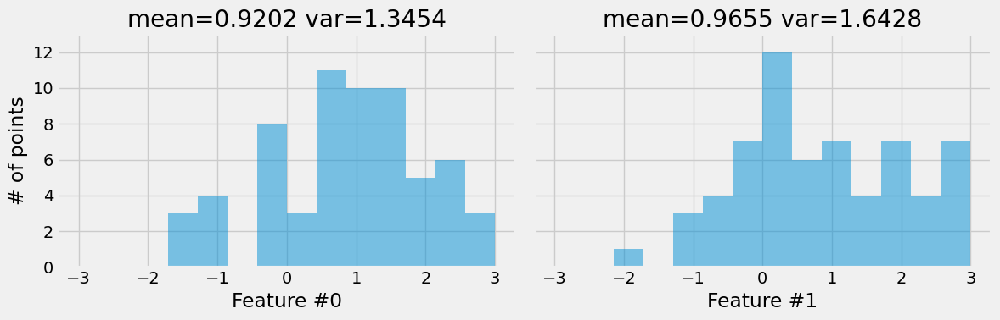

In [ ]:
fig = before_batchnorm(batch1)

In [ ]:
batch_normalizer = nn.BatchNorm1d(num_features=2, affine=False, momentum=None)
batch_normalizer.state_dict()

OrderedDict([('running_mean', tensor([0., 0.])),
             ('running_var', tensor([1., 1.])),
             ('num_batches_tracked', tensor(0))])

In [ ]:
normed1 = batch_normalizer(batch1[0])
batch_normalizer.state_dict()

OrderedDict([('running_mean', tensor([0.9202, 0.9655])),
             ('running_var', tensor([1.3454, 1.6428])),
             ('num_batches_tracked', tensor(1))])

In [ ]:
normed1.mean(axis=0), normed1.var(axis=0)

(tensor([-1.2293e-07,  2.4214e-08]), tensor([1.0159, 1.0159]))

$$
\Large
\begin{aligned}
\text{Biased Var}(X) &= \frac{1}{n} &\sum_{i=1}^n{(x_i - \overline{X})^2}
\\
\text{Var}(X) &= \frac{1}{n-1} &\sum_{i=1}^n{(x_i - \overline{X})^2}
\end{aligned}
$$

In [ ]:
normed1.var(axis=0, unbiased=False)

tensor([1.0000, 1.0000])

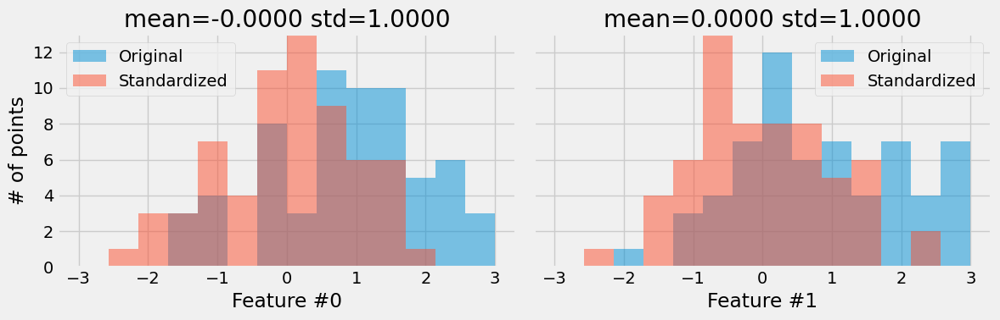

In [ ]:
fig = after_batchnorm(batch1, normed1)

In [ ]:
normed2 = batch_normalizer(batch2[0])
batch_normalizer.state_dict()

OrderedDict([('running_mean', tensor([0.8859, 1.1242])),
             ('running_var', tensor([1.2072, 1.5778])),
             ('num_batches_tracked', tensor(2))])

In [ ]:
mean2, var2 = batch2[0].mean(axis=0), batch2[0].var(axis=0)
running_mean, running_var = (mean1 + mean2) / 2, (var1 + var2) / 2
running_mean, running_var

(tensor([0.8859, 1.1242]), tensor([1.2072, 1.5778]))

## Evaluation Phase

In [ ]:
batch_normalizer.eval()
normed3 = batch_normalizer(batch3[0])
normed3.mean(axis=0), normed3.var(axis=0, unbiased=False)

(tensor([ 0.3452, -0.2217]), tensor([1.0742, 0.8937]))

## Momentum

$$
\large
\begin{array}
& \text{EWMA}_t(\alpha, x) &= &\alpha &x_t &+ &(1-\alpha) &\text{EWMA}_{t-1}(\alpha, x)
\\
\text{running stat}_t &= &\text{"momentum"} &\text{stat}_t &+ &(1-\text{"momentum"}) &\text{running stat}_{t-1}
\end{array}
$$

In [ ]:
batch_normalizer_mom = nn.BatchNorm1d(num_features=2, affine=False, momentum=0.1)
batch_normalizer_mom.state_dict()

OrderedDict([('running_mean', tensor([0., 0.])),
             ('running_var', tensor([1., 1.])),
             ('num_batches_tracked', tensor(0))])

In [ ]:
normed1_mom = batch_normalizer_mom(batch1[0])
batch_normalizer_mom.state_dict()

OrderedDict([('running_mean', tensor([0.0920, 0.0965])),
             ('running_var', tensor([1.0345, 1.0643])),
             ('num_batches_tracked', tensor(1))])

In [ ]:
running_mean = torch.zeros((1, 2))
running_mean = 0.1 * batch1[0].mean(axis=0) + (1 - 0.1) * running_mean
running_mean

tensor([[0.0920, 0.0965]])

## BatchNorm2d

In [ ]:
torch.manual_seed(55)
dummy_images = torch.rand((200, 3, 10, 10))
dummy_labels = torch.randint(2, (200, 1))
dummy_dataset = TensorDataset(dummy_images, dummy_labels)
dummy_loader = DataLoader(dummy_dataset, batch_size=64, shuffle=True)

iterator = iter(dummy_loader)
batch1 = next(iterator)
batch1[0].shape

torch.Size([64, 3, 10, 10])

In [ ]:
batch_normalizer = nn.BatchNorm2d(num_features=3, affine=False, momentum=None)
normed1 = batch_normalizer(batch1[0])
normed1.mean(axis=[0, 2, 3]), normed1.var(axis=[0, 2, 3], unbiased=False)

(tensor([ 5.6326e-08, -4.6715e-08,  1.5348e-08]),
 tensor([0.9999, 0.9999, 0.9999]))

# Residual Connections

## Learning the Identity

In [ ]:
torch.manual_seed(55)
dummy_points = torch.randn((100, 1))
dummy_dataset = TensorDataset(dummy_points, dummy_points)
dummy_loader = DataLoader(dummy_dataset, batch_size=32, shuffle=True)

In [ ]:
class Dummy(nn.Module):
    def __init__(self):
        super(Dummy, self).__init__()
        self.linear = nn.Linear(1, 1)
        self.activation = nn.ReLU()

    def forward(self, x):
        out = self.linear(x)
        out = self.activation(out)
        return out

In [ ]:
torch.manual_seed(666)
dummy_model = Dummy()
dummy_loss_fn = nn.MSELoss()
dummy_optimizer = optim.SGD(dummy_model.parameters(), lr=0.1)

In [ ]:
dummy_sbs = StepByStep(dummy_model, dummy_loss_fn, dummy_optimizer)
dummy_sbs.set_loaders(dummy_loader)
dummy_sbs.train(200)

In [ ]:
np.concatenate([dummy_points[:5].numpy(),
                dummy_sbs.predict(dummy_points)[:5]], axis=1)

array([[1.8616195, 0.       ],
       [0.9035294, 0.       ],
       [1.339468 , 0.       ],
       [1.2004706, 0.       ],
       [1.0069944, 0.       ]], dtype=float32)

In [ ]:
class DummyResidual(nn.Module):
    def __init__(self):
        super(DummyResidual, self).__init__()
        self.linear = nn.Linear(1, 1)
        self.activation = nn.ReLU()

    def forward(self, x):
        identity = x
        out = self.linear(x)
        out = self.activation(out)
        out = out + identity
        return out

In [ ]:
torch.manual_seed(666)
dummy_model = DummyResidual()
dummy_loss_fn = nn.MSELoss()
dummy_optimizer = optim.SGD(dummy_model.parameters(), lr=0.1)
dummy_sbs = StepByStep(dummy_model, dummy_loss_fn, dummy_optimizer)
dummy_sbs.set_loaders(dummy_loader)
dummy_sbs.train(100)

In [ ]:
np.concatenate([dummy_points[:5].numpy(),
                dummy_sbs.predict(dummy_points)[:5]], axis=1)

array([[1.8616195, 1.8616195],
       [0.9035294, 0.9035294],
       [1.339468 , 1.339468 ],
       [1.2004706, 1.2004706],
       [1.0069944, 1.0069944]], dtype=float32)

In [ ]:
dummy_model.state_dict()

OrderedDict([('linear.weight', tensor([[-0.1996]], device='cuda:0')),
             ('linear.bias', tensor([-0.5305], device='cuda:0'))])

In [ ]:
dummy_points.max()

tensor(2.2414)

## Residual Blocks

![](https://github.com/dvgodoy/PyTorchStepByStep/blob/master/images/residual.png?raw=1)

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, skip=True):
        super(ResidualBlock, self).__init__()
        self.skip = skip

        self.conv1 = nn.Conv2d(
            in_channels, out_channels,
            kernel_size=3, padding=1, stride=stride,
            bias=False
        )
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(
            out_channels, out_channels,
            kernel_size=3, padding=1,
            bias=False
        )
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.downsample = None
        if out_channels != in_channels:
            self.downsample = nn.Conv2d(
                in_channels, out_channels,
                kernel_size=1, stride=stride
            )

    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.skip:
            if self.downsample is not None:
                identity = self.downsample(identity)
            out += identity

        out = self.relu(out)
        return out

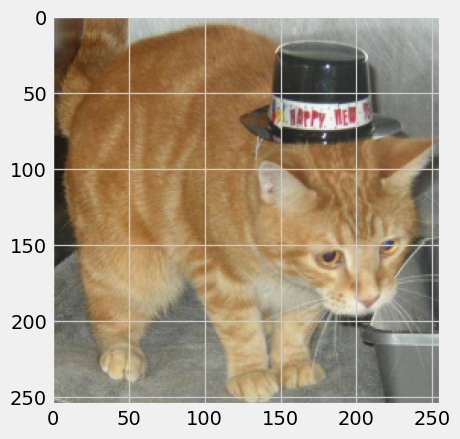

In [ ]:

sample = '/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/test_set/test_set/cats/cat.4121.jpg'
sample = skimage.io.imread(sample)
sample = skimage.transform.resize(sample, (256, 256))
plt.imshow(sample)
plt.show()

In [ ]:
scissors = Image.open('/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/test_set/test_set/cats/cat.4121.jpg')
width, height = scissors.size
image = ToDtype(torch.float32, scale=True)(ToImage()(scissors))[:3, :, :].view(1, 3, width, height)
seed = 666
torch.manual_seed(seed)
skip_image = ResidualBlock(3, 3)(image)
skip_image = ToPILImage()(skip_image[0])

torch.manual_seed(seed)
noskip_image = ResidualBlock(3, 3, skip=False)(image)
noskip_image = ToPILImage()(noskip_image[0])

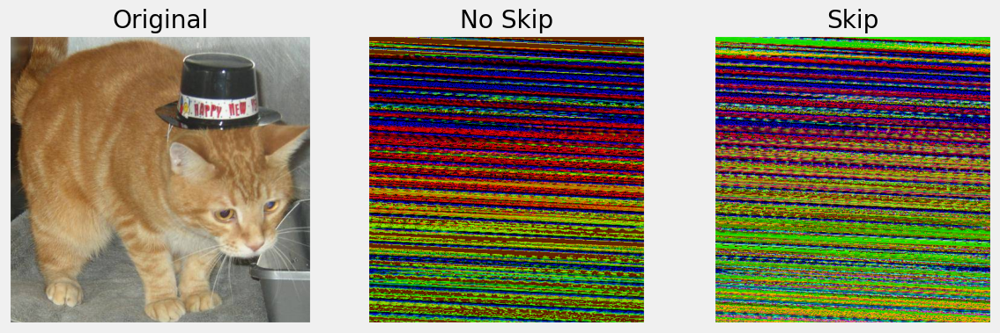

In [ ]:
fig = compare_skip(scissors, noskip_image, skip_image)

# Putting It All Together

In [ ]:
# ImageNet statistics
normalizer = Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])

composer = Compose([Resize(256),
                    CenterCrop(224),
                    ToImage(),
                    ToDtype(torch.float32, scale=True),
                    normalizer])

train_data = ImageFolder(root=train_data_dir, transform=composer)
val_data = ImageFolder(root=test_data_dir, transform=composer)

# Builds a loader of each set
train_loader = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16)

## Fine-tuning

In [ ]:
# repeating import from the top for reference
from torchvision.models.resnet import ResNet18_Weights

# UPDATED
###########################################################
# This is the recommended way of loading a pretrained
# model's weights
model = resnet18(weights=ResNet18_Weights.DEFAULT)
# model = resnet18(pretrained=True)
###########################################################

torch.manual_seed(42)
model.fc = nn.Linear(512, 3)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 108MB/s]


In [ ]:
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_model = optim.Adam(model.parameters(), lr=3e-4)
sbs_transfer = StepByStep(model, multi_loss_fn, optimizer_model)

In [ ]:
sbs_transfer.set_loaders(train_loader, val_loader)
sbs_transfer.train(1)

In [ ]:
StepByStep.loader_apply(val_loader, sbs_transfer.correct)

tensor([[ 976, 1011],
        [ 976, 1012],
        [   0,    0]])

## Feature Extraction

In [ ]:
# repeating import from the top for reference
from torchvision.models.resnet import ResNet18_Weights

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# UPDATED
###########################################################
model = resnet18(weights=ResNet18_Weights.DEFAULT).to(device)
# model = resnet18(pretrained=True).to(device)
###########################################################

model.fc = nn.Identity()
freeze_model(model)

In [ ]:
train_preproc = preprocessed_dataset(model, train_loader)
val_preproc = preprocessed_dataset(model, val_loader)
train_preproc_loader = DataLoader(train_preproc, batch_size=16, shuffle=True)
val_preproc_loader = DataLoader(val_preproc, batch_size=16)

In [ ]:
torch.manual_seed(42)
top_model = nn.Sequential(nn.Linear(512, 3))
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_top = optim.Adam(top_model.parameters(), lr=3e-4)

In [ ]:
sbs_top = StepByStep(top_model, multi_loss_fn, optimizer_top)
sbs_top.set_loaders(train_preproc_loader, val_preproc_loader)
sbs_top.train(10)

In [ ]:
StepByStep.loader_apply(val_preproc_loader, sbs_top.correct)

tensor([[ 997, 1011],
        [ 999, 1012],
        [   0,    0]])

In [ ]:
model.fc = top_model
sbs_temp = StepByStep(model, None, None)

In [ ]:
StepByStep.loader_apply(val_loader, sbs_temp.correct)

tensor([[ 997, 1011],
        [ 999, 1012],
        [   0,    0]])

---
# 🐕 **Dogs-vs-Cats** 🐈 - VGG16

---

### Importações:

- `numpy as np`: Biblioteca fundamental para operações matemáticas eficientes em arrays e matrizes.

- `matplotlib.pyplot as plt`: Utilizado para criar gráficos e visualizações de dados.

- `os`: Manipula diretórios e arquivos.

- `cv2`: OpenCV, usado para processamento de imagens (leitura, conversão de cores, etc.).

- `random`: Gera números aleatórios.

- `pandas as pd`: Ferramenta poderosa para manipulação e análise de dados em forma de tabelas (DataFrames).

### Módulos do TensorFlow

1. Preprocessamento de Imagens:

    `ImageDataGenerator`: Cria conjuntos de dados com aumento artificial, como rotações e redimensionamentos de imagens.

2. Modelos e Camadas:

    `Sequential`: Monta a arquitetura do modelo camada por camada.

    `Model`: Fornece uma interface mais flexível para arquiteturas complexas.

    `load_model`: Carrega um modelo treinado salvo.

    `Convolution2D`: Adiciona uma camada convolucional que detecta padrões nas imagens (como bordas).

    `MaxPooling2D`: Reduz a dimensão espacial das imagens, mantendo os recursos mais importantes.

    `Dense`: Camada totalmente conectada para classificação.

    `Flatten`: Achata as matrizes em vetores para camadas densas.

    `InputLayer`: Define a entrada do modelo.

3. Modelos Pré-Treinados:

    `VGG16`: Modelo pré-treinado muito popular para classificação de imagens, usado frequentemente como base para transfer learning.

4. Otimizadores:

    `SGD`: Gradiente descendente estocástico, um otimizador para ajustar os pesos do modelo.

5. Funções Auxiliares:

  `clear_session`: Libera recursos ocupados pelo backend do TensorFlow, evitando problemas em execuções contínuas.

  `ModelCheckpoint`: Salva o melhor modelo com base em uma métrica (por exemplo, val_accuracy).

  `EarlyStopping`: Interrompe o treinamento se a performance parar de melhorar.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os, cv2, random
import pandas as pd

from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Convolution2D,MaxPooling2D, Dense, Flatten, InputLayer
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.backend import clear_session
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

## Download Dataset

### Descrição do conjunto de dados

- O Dataset foi obtido em [Kaggle](https://www.kaggle.com/datasets/tongpython/cat-and-dog/data).
- O arquivo de treinamento contém 25.000 imagens de cães e gatos (1 = cão, 0 = gato).
- Tamanho: 853.96 MB

In [2]:
import kagglehub
# Download latest version
path = kagglehub.dataset_download("tongpython/cat-and-dog")
print("Path to dataset files:", path)

100%|██████████| 218M/218M [00:10<00:00, 21.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1


## Criando path do diretório

In [3]:
input_path = '/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1'
train_dir = '/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/training_set/training_set'
test_dir = '/root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/test_set/test_set'

## Criando Dataframe e Data Generator

- Estrutura do quadro: { 'filename': [...], 'class': ['dog',...] }.
- Criar o quadro com a estrutura acima e embaralhar random (frac=1).
- Foi reaalizado o Data Augmentation e shuffle apenas com dados de treinamento (o conjunto de validação de shuffle não obtém nada)
- Dividindo 80% para treinamento, 20% para teste.
- Cada conjunto, foi em vários lotes.
- Como o Dataset possui apenas 2 classes, o modo será binário.


In [4]:
df = pd.DataFrame()                                             # Cria um DataFrame vazio para armazenar informações dos arquivos de imagens

fnames = os.listdir(train_dir)                                  # Lista os nomes dos arquivos presentes no diretório de treinamento

image_files = []                                                # Obtém uma lista com todos os arquivos de imagem presentes nas subpastas 'dogs' e 'cats'
for class_name in ['dogs', 'cats']:                             # Itera pelas classes
    class_dir = os.path.join(train_dir, class_name)
    for filename in os.listdir(class_dir):                      # Itera pelos arquivos em cada subdiretório
        image_files.append(os.path.join(class_name, filename))  # Adiciona o caminho relativo da imagem

df = pd.DataFrame({'filename': image_files})                    # Cria um DataFrame com os nomes dos arquivos e uma coluna que identifica a classe das imagens
df['class'] = df['filename'].apply(lambda x: x.split('/')[0])   # Extrai a classe a partir do nome do caminho
df = df.sample(frac=1)                                          # Embaralha aleatoriamente os dados

train_datagen = ImageDataGenerator(
    rescale=1/255,                                              # Normaliza os valores dos pixels para [0, 1]
    rotation_range=20,                                          # Rotação aleatória de até 20 graus
    shear_range=0.2,                                            # Transformação de cisalhamento
    width_shift_range=0.2,                                      # Deslocamento horizontal aleatório
    height_shift_range=0.2,                                     # Deslocamento vertical aleatório
    horizontal_flip=True,                                       # Flip horizontal das imagens
    zoom_range=0.2                                              # Zoom aleatório em até 20%
)

valid_datagen = ImageDataGenerator(rescale=1/255)               # Apenas normalização para validação

idx = int(0.8 * len(df))                                        # Divide os dados em 80% para treinamento e 20% para validação
train_df = df.iloc[:idx]                                        # Dados de treinamento
valid_df = df.iloc[idx:]                                        # Dados de validação

target = (224, 224)                                             # Define o tamanho-alvo das imagens (224x224 pixels)

train_set = train_datagen.flow_from_dataframe(
    train_df,                                                   # DataFrame com dados de treinamento
    directory=train_dir,                                        # Diretório base das imagens
    shuffle=True,                                               # Embaralha os dados
    target_size=target,                                         # Redimensiona as imagens para 224x224
    batch_size=64,                                              # Lote com 64 imagens
    class_mode='binary'                                         # Classificação binária ('dogs' ou 'cats')
)

valid_set = valid_datagen.flow_from_dataframe(
    valid_df,                                                   # DataFrame com dados de validação
    directory=train_dir,
    shuffle=False,                                              # Não embaralha dados de validação
    target_size=target,
    batch_size=32,
    class_mode='binary'
)

Found 6403 validated image filenames belonging to 2 classes.
Found 1602 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


## VGG 1-block model
- Este é o modelo com estilo VGG usando 1 bloco de Conv2D e Pooling
- Taxa de aprendizagem 0,05
- Momentum .9 e Nesterov (otimizador NAG)
- A função de perda é entropia cruzada binária (classificação binária somente gato ou cachorro)

In [5]:
clear_session()                                 # Limpa qualquer sessão anterior da memória, evitando conflitos ao treinar um novo modelo

model = Sequential([
    InputLayer(shape=target + (3,)),            # Define a camada de entrada com uma imagem de tamanho (224, 224) com 3 canais de cores (RGB)
    Convolution2D(32, 3, activation='relu'),    # Primeira camada convolucional com 32 filtros de tamanho 3x3 e função de ativação ReLU
    MaxPooling2D(2),                            # Camada de pooling para reduzir as dimensões das características extraídas (2x2 pooling)
    Flatten(),                                  # Camada Flatten para transformar a saída matricial em um vetor unidimensional
    Dense(512, activation='relu'),              # Camada totalmente conectada (fully connected) com 512 neurônios e função de ativação ReLU
    Dense(1, activation='sigmoid')              # Camada de saída com 1 neurônio e função de ativação sigmoid para classificação binária
])

model.summary()                                 # Exibe um resumo da arquitetura do modelo

opt = SGD(                                      # Configura o otimizador Stochastic Gradient Descent (SGD)
    learning_rate=0.05,                         # Taxa de aprendizado inicial
    momentum=0.9,                               # Fator de momentum para acelerar o treinamento
    nesterov=True                               # Uso do método de Nesterov para um ajuste mais eficiente
)

model.compile(                                  # Compila o modelo com função de perda binária e métrica de precisão (accuracy)
    loss='binary_crossentropy',                 # Função de perda para classificação binária
    optimizer=opt,                              # Otimizador configurado com SGD
    metrics=['acc']                             # Métrica para monitorar precisão
)

model.optimizer.get_config()                    # Exibe a configuração do otimizador

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 394272)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │     201,867,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 201,869,185 (770.07 MB)

 Trainable params: 201,869,185 (770.07 MB)

 Non-trainable params: 0 (0.00 B)

{'name': 'SGD',
 'learning_rate': 0.05000000074505806,
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': None,
 'loss_scale_factor': None,
 'gradient_accumulation_steps': None,
 'momentum': 0.9,
 'nesterov': True}

## VGG 2-block model
- Este é o modelo com estilo VGG usando 2 blocos de Conv2D e Pooling
- Usando a taxa de aprendizado 0,05
- Momentum 0,9 e Nesterov (otimizador NAG)
- A função de perda é entropia cruzada binária (classificação binária apenas gato ou cachorro)

In [6]:
clear_session()

model = Sequential([
    InputLayer(shape=target+(3,)),
    Convolution2D(32,3,activation='relu'),
    MaxPooling2D(2),
    Convolution2D(64,3,activation='relu'),
    MaxPooling2D(2),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
])
model.summary()

opt = SGD(learning_rate = 0.05,
          momentum = 0.9,
          nesterov = True)
model.compile(loss='binary_crossentropy',optimizer=opt,metrics=['acc'])
model.optimizer.get_config()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      95,552,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 95,571,905 (364.58 MB)

 Trainable params: 95,571,905 (364.58 MB)

 Non-trainable params: 0 (0.00 B)

{'name': 'SGD',
 'learning_rate': 0.05000000074505806,
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': None,
 'loss_scale_factor': None,
 'gradient_accumulation_steps': None,
 'momentum': 0.9,
 'nesterov': True}

## Modelo VGG de 3 blocos
- Este é o modelo com estilo VGG usando 3 blocos de Conv2D e Pooling
- Usando a taxa de aprendizado 0,05
- Momentum 0,9 e Nesterov (otimizador NAG)
- A função de perda é entropia cruzada binária (classificação binária apenas gato ou cachorro)

In [7]:
clear_session()

model = Sequential([
    InputLayer(shape=target+(3,)),
    Convolution2D(32,3,activation='relu'),
    MaxPooling2D(2),
    Convolution2D(64,3,activation='relu'),
    MaxPooling2D(2),
    Convolution2D(128,3,activation='relu'),
    MaxPooling2D(2),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
])
model.summary()

opt = SGD(learning_rate = 0.05,
          momentum = 0.9,
          nesterov = True)
model.compile(loss='binary_crossentropy',optimizer=opt,metrics=['acc'])
model.optimizer.get_config()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      44,302,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,396,609 (169.36 MB)

 Trainable params: 44,396,609 (169.36 MB)

 Non-trainable params: 0 (0.00 B)

{'name': 'SGD',
 'learning_rate': 0.05000000074505806,
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': None,
 'loss_scale_factor': None,
 'gradient_accumulation_steps': None,
 'momentum': 0.9,
 'nesterov': True}

## Modelo modificado VGG-16
- Usando o modelo pré-treinado VGG-16 sem camadas superiores.
- A imagem necessária do VGG-16 da forma (224,224).
- Congelando os parâmetros treinados do modelo.
- Adicionando a camada superior.

In [11]:
clear_session()

# Carrega o modelo VGG16 pré-treinado, sem a última camada de classificação (include_top=False)
# O input shape é ajustado para imagens de tamanho 224x224 com 3 canais de cores (RGB)
model = VGG16(include_top=False, input_shape=target+(3,))

for layer in model.layers:
    layer.trainable = False

flat1 = Flatten()(model.layers[-1].output)                                      # Achata a saída da última camada convolucional do VGG16 para transformá-la em um vetor
class1 = Dense(128, activation='relu', kernel_initializer='he_uniform')(flat1)  # Utiliza ReLU como função de ativação e a inicialização 'he_uniform' para melhor desempenho em redes profundas
output = Dense(1, activation='sigmoid')(class1)                                 # Camada de saída com 1 neurônio e função de ativação sigmoid para classificação binária
model = Model(inputs=model.inputs, outputs=output)                              # Define o modelo final com as entradas da VGG16 e a nova saída personalizada

model.summary()

opt = SGD(learning_rate = 0.001, momentum = 0.9)                                # Configura o otimizador Stochastic Gradient Descent (SGD)

model.compile(loss='binary_crossentropy', optimizer=opt,metrics=['acc'])        # Compila o modelo com função de perda binária e métrica de precisão

model.optimizer.get_config()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 17,926,209 (68.38 MB)

 Trainable params: 3,211,521 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

{'name': 'SGD',
 'learning_rate': 0.0010000000474974513,
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': None,
 'loss_scale_factor': None,
 'gradient_accumulation_steps': None,
 'momentum': 0.9,
 'nesterov': False}

## Modelo de treinamento
Nesta seção, é realizado o treinamento do modelo com o ponto de verificação e o método de parada antecipada:

### Ponto de verificação:
- Salvamos apenas o melhor modelo que tem o maior valor `val_acc`
- Salvamos todo o modelo, não apenas o peso
- O modo é automático, o que significa que foi selecionado o modelo cujo valor máximo é `val_acc`

### Parada antecipada:
- Também utilizou-se o valor `val_acc` do modelo para avaliar
- Se o modelo não melhorar após 10 épocas, o treinamento é parado (pode ser convergido)

### Treinamento:
- A iteração de cada época pode ser calculada por: número de dados / tamanho do lote (foram utilizados todos os lotes para treinar)

In [12]:
# Callback para salvar o melhor modelo durante o treinamento
checkpoint = ModelCheckpoint(
    "temp_model.keras",                                     # Caminho para salvar o modelo
    monitor='val_acc',                                      # Métrica monitorada: precisão na validação
    verbose=1,                                              # Mostra mensagens no console sobre salvamentos
    save_best_only=True,                                    # Salva apenas o modelo com o melhor desempenho
    save_weights_only=False,                                # Salva o modelo completo, não apenas os pesos
    mode='auto'                                             # Escolhe automaticamente entre maximização/minimização da métrica
)

# Callback para interromper o treinamento antecipadamente caso não haja melhoria
early = EarlyStopping(
    monitor='val_acc',                                      # Métrica monitorada: precisão na validação
    min_delta=0,                                            # Diferença mínima necessária para considerar melhoria
    patience=10,                                            # Número de épocas sem melhoria antes de parar
    verbose=1,                                              # Exibe mensagens sobre a interrupção
    mode='auto'                                             # Determina automaticamente se a métrica deve ser max/min
)

# Inicia o treinamento do modelo
history = model.fit(
    train_set,                                              # Conjunto de dados de treinamento
    validation_data=valid_set,                              # Conjunto de dados de validação
    steps_per_epoch=train_set.n // train_set.batch_size,    # Passos por época no treinamento
    validation_steps=valid_set.n // valid_set.batch_size,   # Passos por época na validação
    epochs=50,                                              # Número máximo de épocas
    callbacks=[checkpoint, early]                           # Lista de callbacks (salvamento e interrupção antecipada)
)

Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 856ms/step - acc: 0.6594 - loss: 0.6124
Epoch 1: val_acc improved from -inf to 0.87750, saving model to temp_model.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 100s 936ms/step - acc: 0.6601 - loss: 0.6114 - val_acc: 0.8775 - val_loss: 0.2989
Epoch 2/50
  1/100 ━━━━━━━━━━━━━━━━━━━━ 26s 266ms/step - acc: 0.8438 - loss: 0.4041
Epoch 2: val_acc improved from 0.87750 to 1.00000, saving model to temp_model.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - acc: 0.8438 - loss: 0.4041 - val_acc: 1.0000 - val_loss: 0.2120
Epoch 3/50
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 853ms/step - acc: 0.8345 - loss: 0.3747
Epoch 3: val_acc did not improve from 1.00000
100/100 ━━━━━━━━━━━━━━━━━━━━ 137s 911ms/step - acc: 0.8348 - loss: 0.3743 - val_acc: 0.8850 - val_loss: 0.2594
Epoch 4/50
  1/100 ━━━━━━━━━━━━━━━━━━━━ 26s 267ms/step - acc: 0.8906 - loss: 0.2421
Epoch 4: val_acc did not improve from 1.00000
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - acc: 0.8906 - loss: 0.2421 - val_ac

## Plot de perdas e acurácia

Esta etapa pode ajudar a detectar o problema de overfitting observando a curva de aprendizado

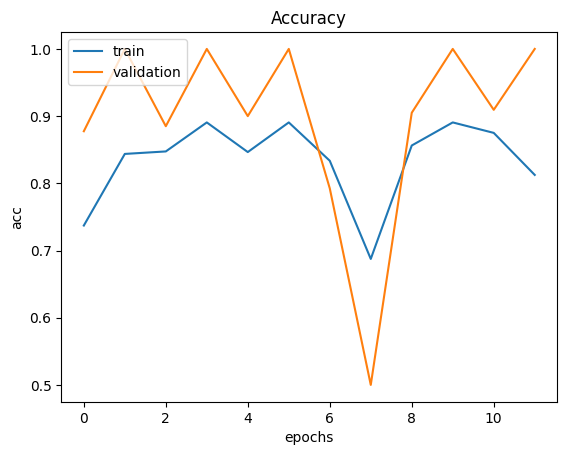

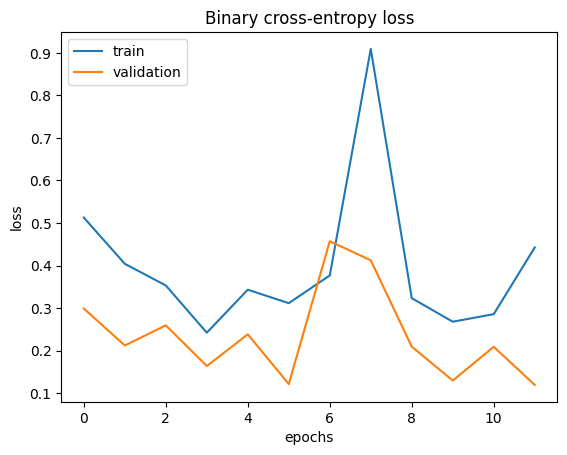

In [13]:
legend = ['train','validation']

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title("Accuracy")
plt.xlabel("epochs")
plt.ylabel("acc")
plt.legend(legend,loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("Binary cross-entropy loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(legend,loc='upper left')
plt.show()

## Salvando o novo modelo

In [14]:
model.save('my_model.keras')

## Carregando o novo modelo

In [15]:
model = load_model('my_model.keras')
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,137,732 (80.63 MB)

 Trainable params: 3,211,521 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 3,211,523 (12.25 MB)

## Testando a acurácia após carregar o modelo

In [16]:
print("Accuracy:",model.evaluate(valid_set))

51/51 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - acc: 0.9192 - loss: 0.1877
Accuracy: [0.20487868785858154, 0.9107365608215332]


## Removendo a camada de conv para visualizar a previsão

In [17]:
layer_outputs = []
for layer in model.layers:
    if 'conv' not in(layer.name):
        continue
    layer_outputs.append(layer.output)

activation_model = Model(inputs = model.input, outputs = layer_outputs)

## Definindo Funções

- **Preprocess**: usado para redimensionar a função para o tamanho alvo e mapear o valor do pixel para [0,1]
- **Predict**: criar o lote e obter a probabilidade do modelo
Obter rótulo: obter o rótulo da previsão da probabilidade
- **Visualize**: visualizar a saída das camadas de conv
Obter caixa: obter a melhor caixa prevista que contém o cão/gato usando a janela deslizante

In [18]:
# Redimensiona a imagem para o tamanho especificado em target.
def preprocess(img):
    img = cv2.resize(img,target)
    img = img/255
    return np.array(img)

# Redimensiona a imagem para adicionar uma dimensão de lote (batch dimension), necessária para a entrada do modelo.
def predict(img):
    img = preprocess(img)
    img = img.reshape((1,)+img.shape)
    probability = model.predict(img)
    return probability

# Converte a probabilidade em uma classe binária (0 ou 1) com base no limiar de 0.5 e retorna o rótulo correspondente à classe.
def getLabel(probability):
    if probability<0.5:
        probability=0
    else:
        probability=1
    return list(train_set.class_indices)[probability]

# Pré-processa a imagem e redimensiona para adicionar a dimensão de lote. Visualiza os mapas de características em uma grade de 8x8.
def visualize(img):
    img = preprocess(img)
    img = img.reshape((1,)+img.shape)
    fmaps = activation_model.predict(img)

    for i in range(len(fmaps)):
        activation = fmaps[i]

        fig = plt.figure(figsize=(20,15))
        fig.suptitle(layer_outputs[i].name)

        for j in range(min(8*8,activation.shape[-1])):
            plt.subplot(8,8,j+1)
            plt.imshow(activation[0,:,:,j],cmap='gray')
    plt.show()

# Cria uma lista de tamanhos de janela (window sizes) que variam de 100 a 260, com incrementos de 20.
WIN_SIZES=[]
for i in range(100,260,20):
    WIN_SIZES.append(i)

# Para cada janela, faz uma predição e calcula a distância entre a probabilidade da janela e a probabilidade da imagem inteira.
def get_box(img,step=20,win_sizes=WIN_SIZES):
    best_box = None
    best_distance = 1
    raw_prob = predict(img)
    if (raw_prob<0.5):
        raw_prob=0
    else:
        raw_prob=1

    for win in win_sizes:
        print("Run with window size:",str(win))
        for top in range(0,img.shape[0]-win+1,step):
            for left in range(0,img.shape[1]-win+1,step):
                box = (left,top,left+win,top+win)
                crop = img[box[1]:box[3],box[0]:box[2]]
                prob = predict(crop)
                distance = abs(raw_prob-prob)
                if (distance<best_distance):
                    best_box = box
                    best_distance = distance
    return (best_box, best_distance)

## Testando previsão com imagens aleatórias

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


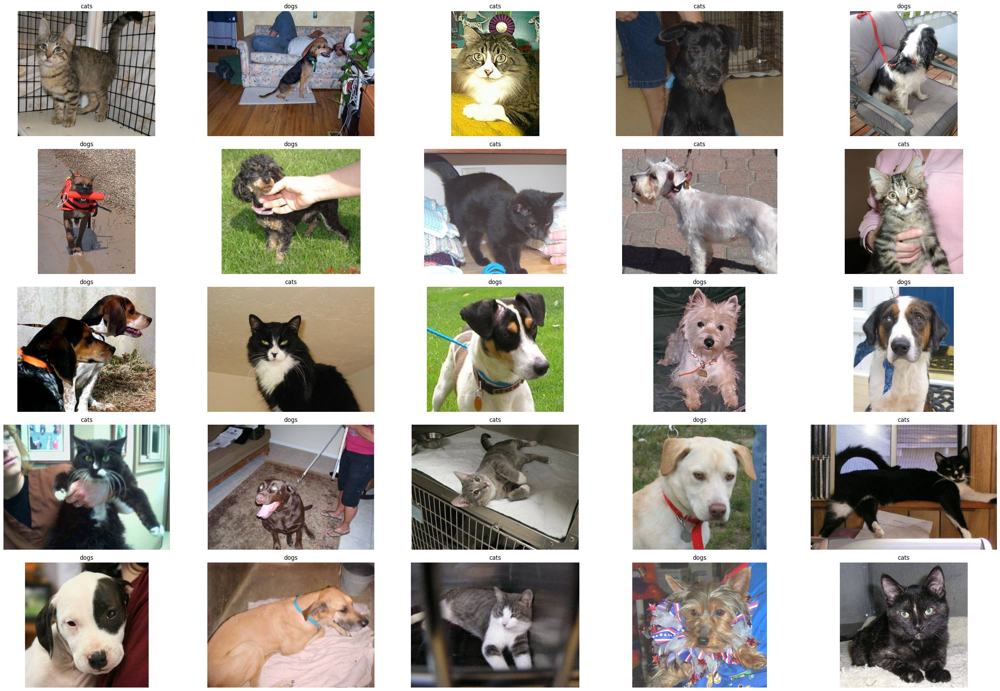

In [19]:
# Verifica se um arquivo tem uma extensão de imagem válida.
def is_image_file(filename):
    valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']
    return any(filename.lower().endswith(ext) for ext in valid_extensions)

# Obter lista completa de arquivos de imagem (recursivo). Se for uma imagem, adiciona o caminho completo do arquivo à lista test_fnames.
test_fnames = []
for root, _, files in os.walk(test_dir):
    for file in files:
        if is_image_file(file):
            test_fnames.append(os.path.join(root, file))

# Embaralha a lista de caminhos de imagens (test_fnames) para garantir que as imagens sejam selecionadas aleatoriamente.
random.shuffle(test_fnames)
result = []

nRow = 5
nCol = 5
nPic = nRow * nCol

# Cria uma figura (fig) e um conjunto de eixos (ax) para exibir as imagens em uma grade de 5x5.
fig, ax = plt.subplots(nRow, nCol, figsize=(30, 20))

# Itera sobre a lista de caminhos de imagens (test_fnames).
for i, pred_path in enumerate(test_fnames):
    if i == nPic:
        break

    img = cv2.imread(pred_path)                            # Para cada imagem, lê o arquivo usando cv2.imread.
    if img is not None:                                    # Converte a imagem de BGR (formato padrão do OpenCV) para RGB (formato esperado pelo matplotlib).
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        col = i % nCol
        row = i // nCol
        title = getLabel(predict(img))
        ax[row][col].imshow(img)
        ax[row][col].set_title(title)
        ax[row][col].axis('off')
    else:
        print(f"Could not read image at: {pred_path}")

plt.tight_layout()
plt.show()

Imagem selecionada: /root/.cache/kagglehub/datasets/tongpython/cat-and-dog/versions/1/test_set/test_set/dogs/dog.4483.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


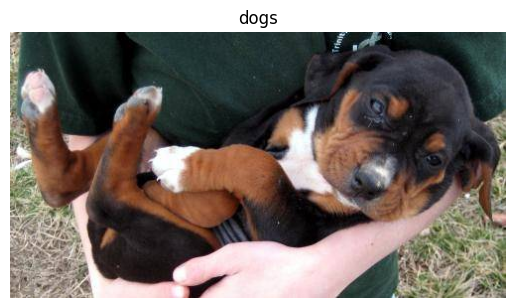

In [21]:
def is_image_file(filename):
    valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']
    return any(filename.lower().endswith(ext) for ext in valid_extensions)

# Gerar a lista completa de arquivos de imagem (recursivamente)
test_fnames = []
for root, _, files in os.walk(test_dir):
    for file in files:
        if is_image_file(file):
            test_fnames.append(os.path.join(root, file))  # Caminho completo da imagem

# Selecionar uma imagem aleatória
idPic = random.randint(0, len(test_fnames) - 1)  # Garante um índice válido
pred_path = test_fnames[idPic]  # Caminho completo para a imagem selecionada
print(f"Imagem selecionada: {pred_path}")

# Carregar a imagem com OpenCV
img = cv2.imread(pred_path)
if img is not None:
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Obter a previsão
    title = getLabel(predict(img))

    # Exibir a imagem e o resultado
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()
else:
    print(f"Não foi possível ler o arquivo: {pred_path}")

## Visualizando as camadas de saída da CNN

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


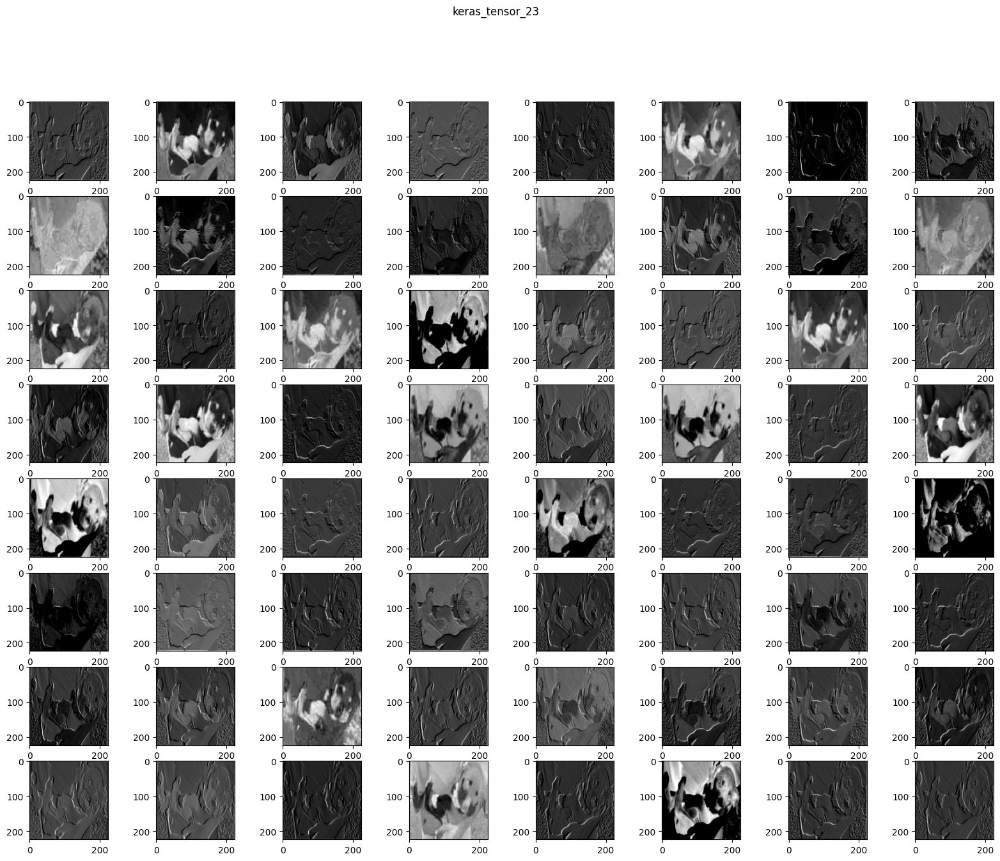

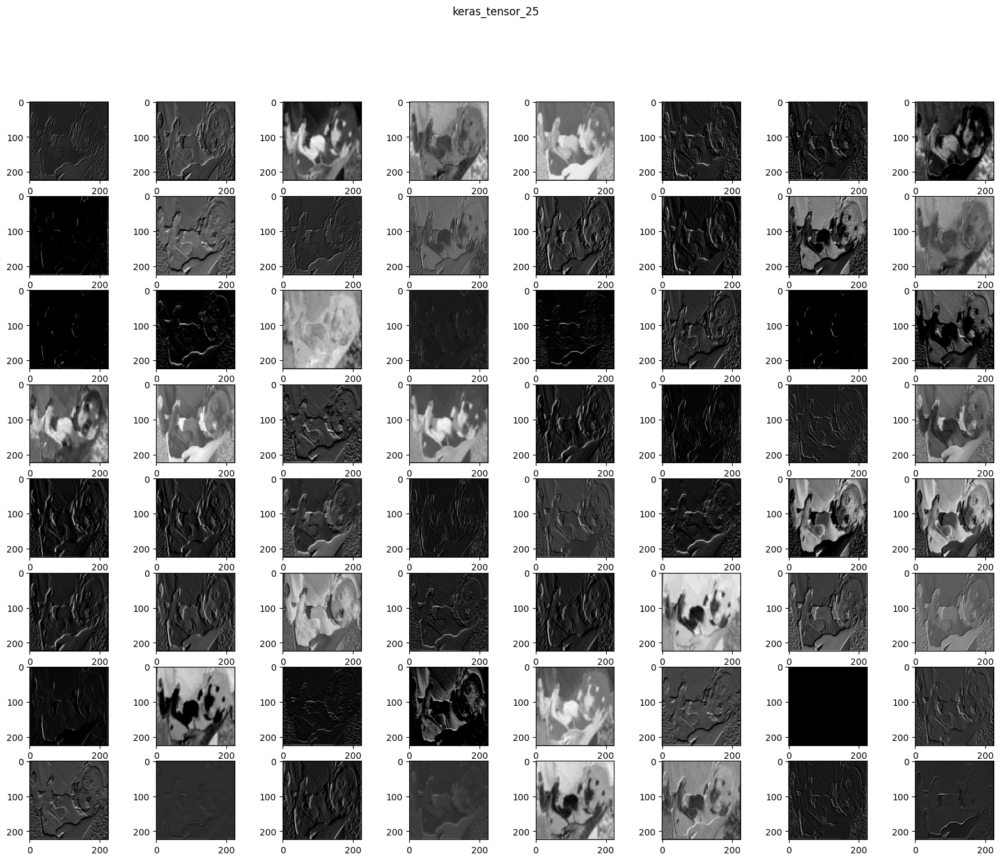

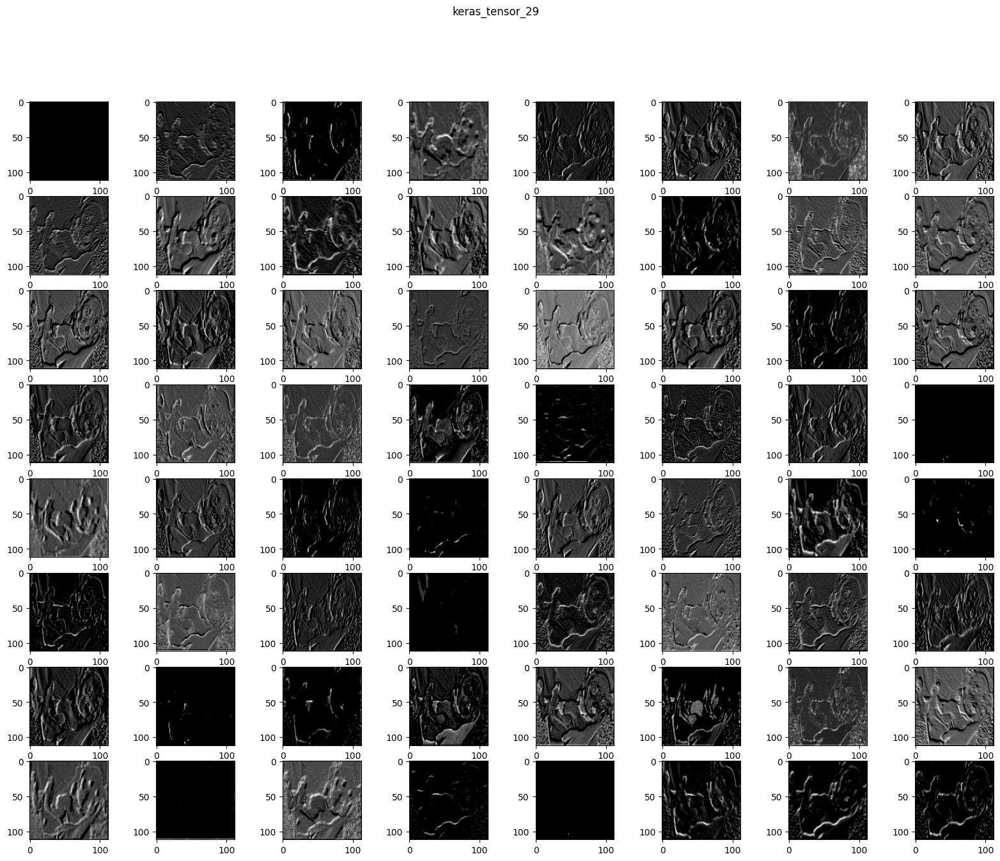

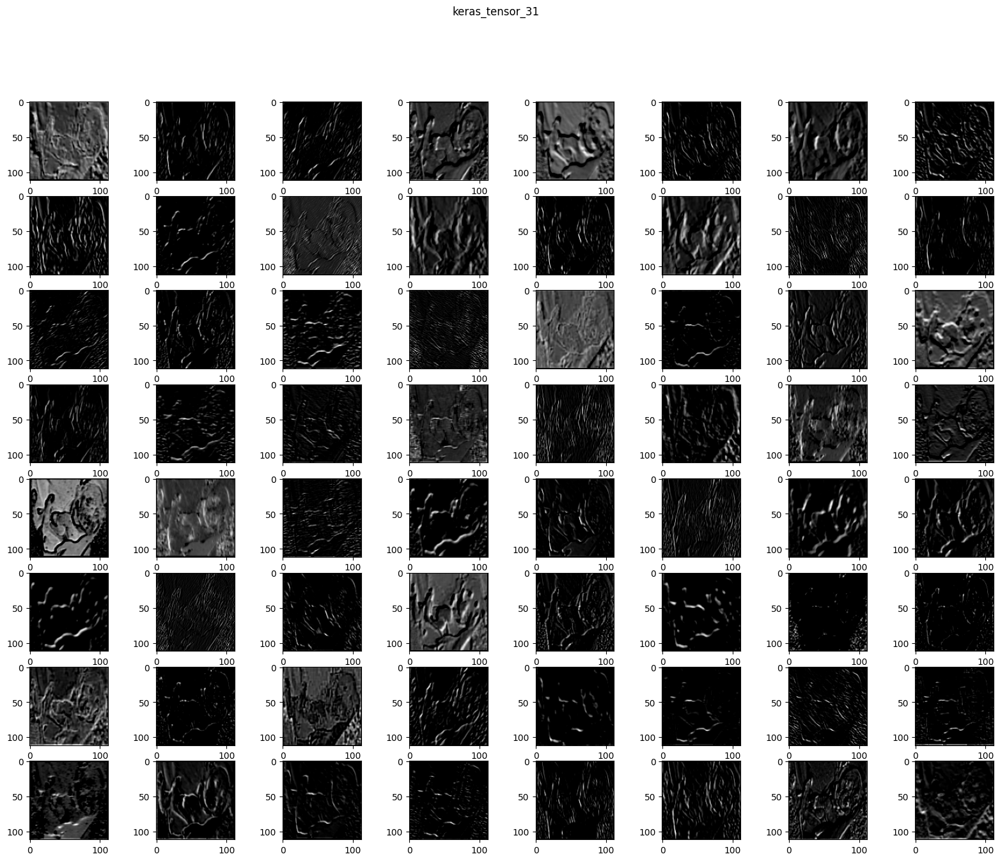

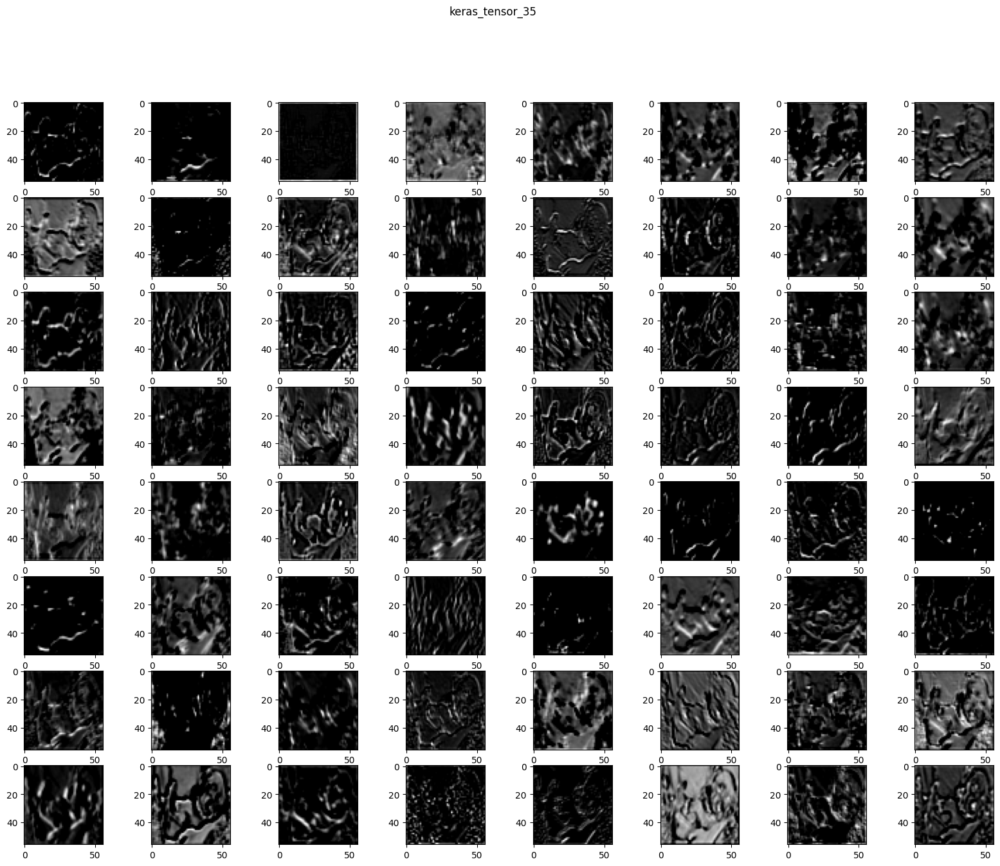

...

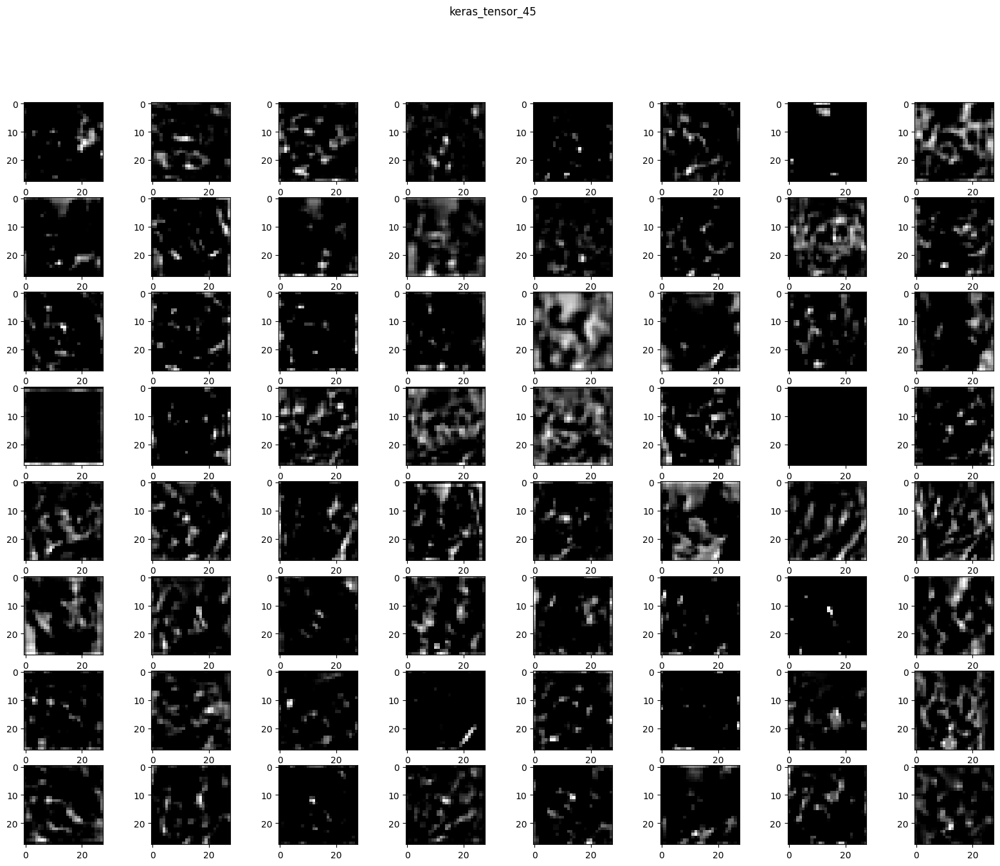

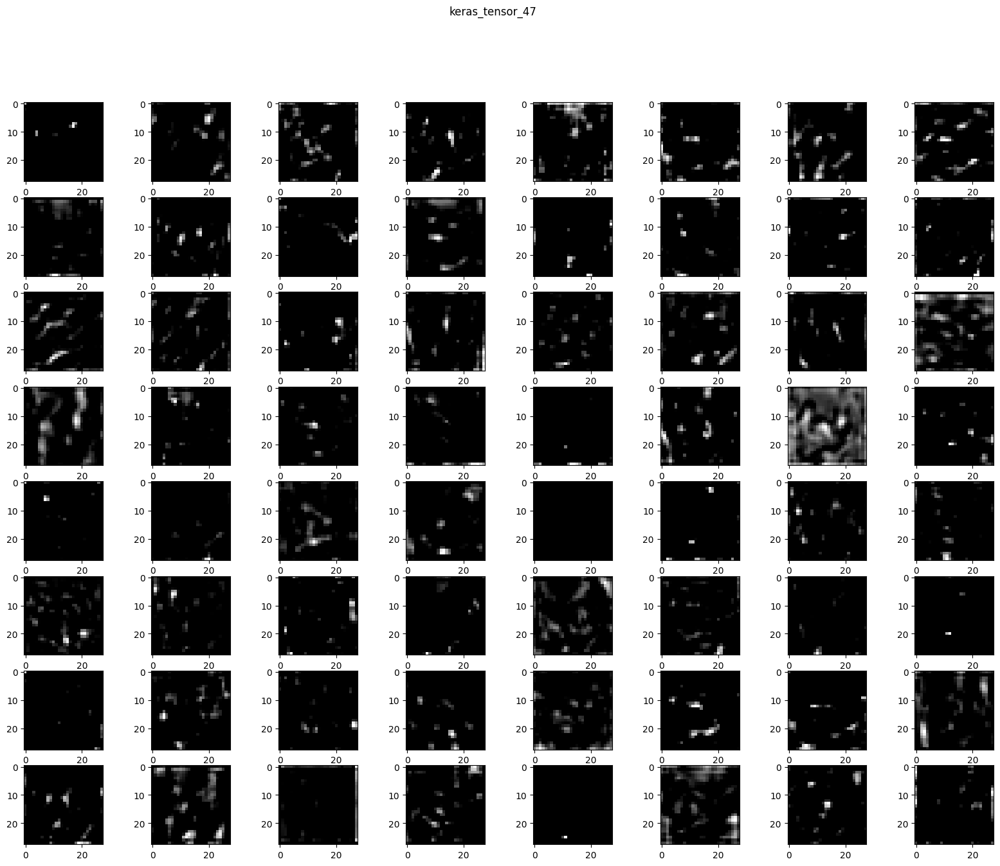

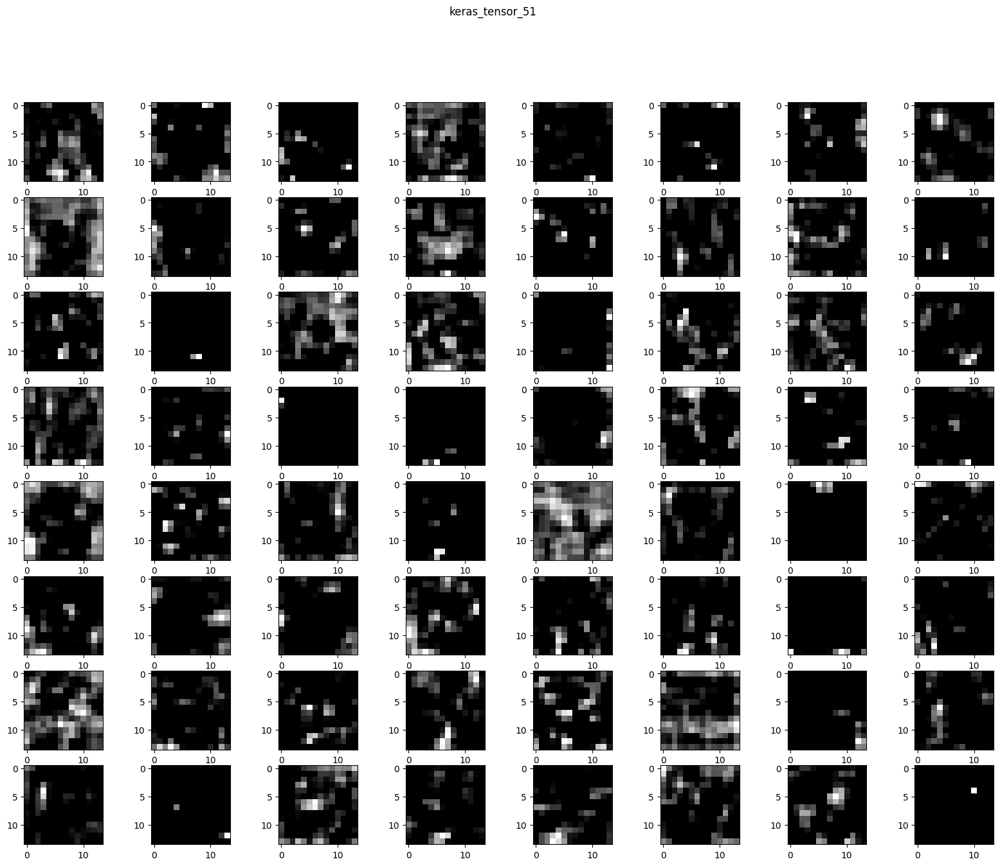

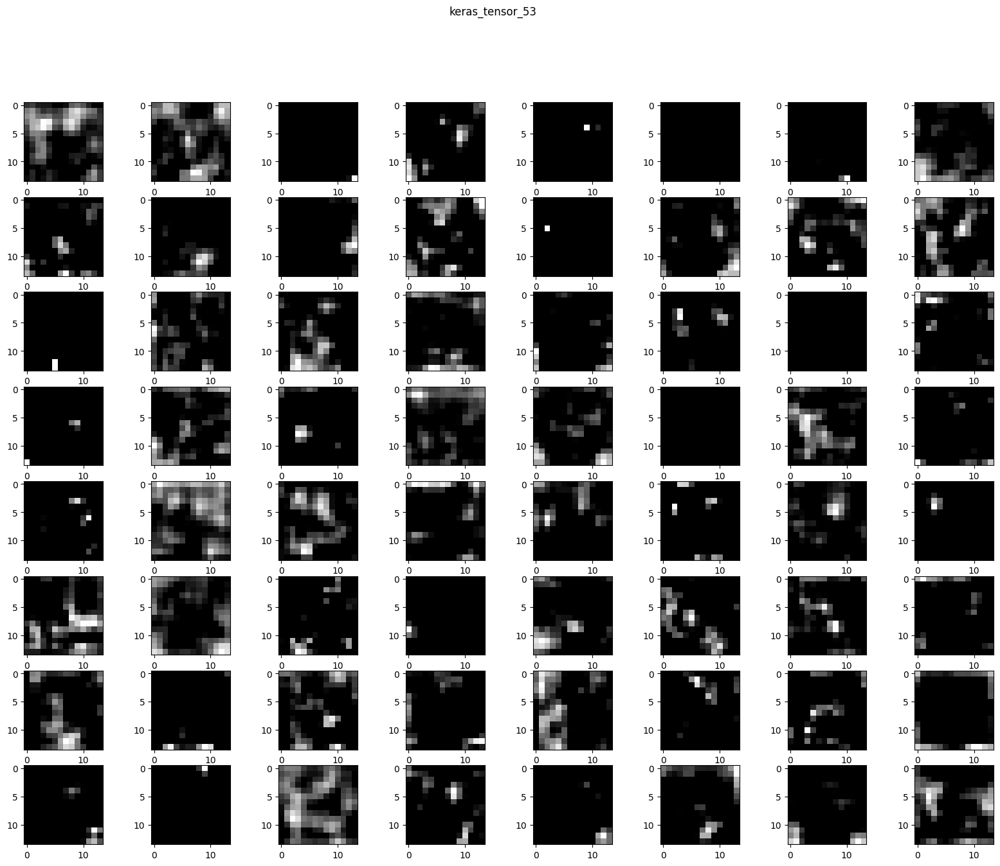

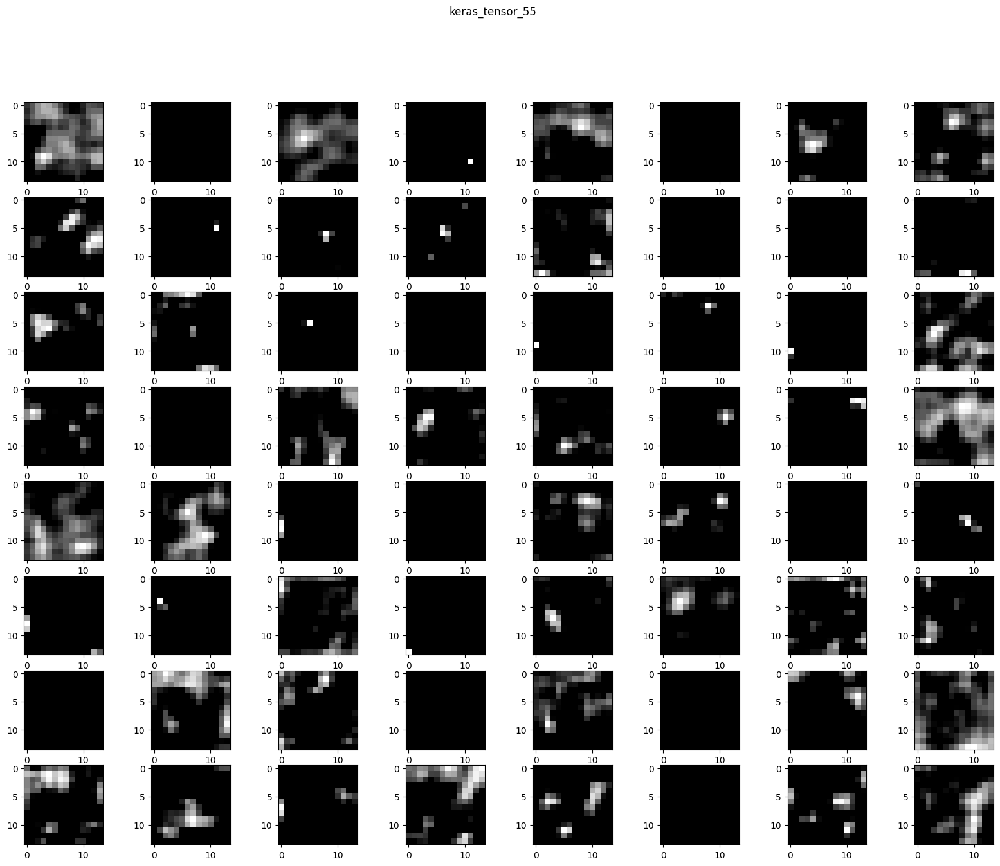

In [22]:
visualize(img)

## Sliding window

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Run with window size: 100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

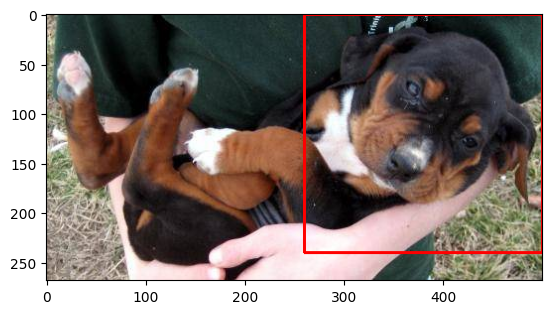

In [23]:
# Encontrando a melhor caixa de ajuste para detecção
box, best_distance = get_box(img)
print("Probabilidade:", float(1 - best_distance[0, 0]))
startPoint = (box[0],box[1])
endPoint = (box[2],box[3])

# Desenhar retângulo e mostrar imagem
COLOR=(255,0,0)
img = cv2.rectangle(img,startPoint,endPoint,COLOR,2)
plt.imshow(img)

# Conclusão

